In [2]:
import slideflow as sf
import numpy as np
import os
from pathlib import Path

In [3]:
# Configure paths for dataset processing
datasets_folder = 'datasets'
output_folder = 'datasets_reinhard'

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

print("="*70)
print("REINHARD NORMALIZATION - BATCH PROCESSING")
print("="*70)
print(f"\nInput folder: {datasets_folder}")
print(f"Output folder: {output_folder}")

# Find all .npz files in datasets folder
if os.path.exists(datasets_folder):
    npz_files = list(Path(datasets_folder).glob('*.npz'))
    print(f"\nFound {len(npz_files)} NPZ files:")
    for file in npz_files:
        print(f"  - {file.name}")
else:
    print(f"\n✗ Datasets folder '{datasets_folder}' not found!")
    print("Please create the folder or update the path.")
    npz_files = []

print(f"\n{'='*70}")


REINHARD NORMALIZATION - BATCH PROCESSING

Input folder: datasets
Output folder: datasets_reinhard

Found 9 NPZ files:
  - colon_nk_train.npz
  - breast_nk_val.npz
  - lung_nk_train.npz
  - colon_nk_val.npz
  - lung_nk_val.npz
  - lung_nk_test.npz
  - colon_nk_test.npz
  - breast_nk_train.npz
  - breast_nk_test.npz



In [3]:
# Function to apply Reinhard normalization to NPZ files
def apply_reinhard_to_npz(input_file, output_file):
    """
    Apply Reinhard stain normalization to all images in an NPZ file.
    
    Parameters:
    - input_file: Path to input NPZ file
    - output_file: Path to output NPZ file
    
    Returns:
    - Dictionary with processing results
    """
    results = {
        'input': str(input_file),
        'output': str(output_file),
        'success': False,
        'total_images': 0,
        'normalized_images': 0,
        'failed_images': 0,
        'errors': []
    }
    
    try:
        # Load NPZ file
        print(f"\nLoading {input_file.name}...")
        data = np.load(str(input_file), allow_pickle=True)
        
        # Extract images and labels
        images = data['images']
        total_images = len(images)
        results['total_images'] = total_images
        
        print(f"  - Total images: {total_images}")
        print(f"  - Image shape: {images[0].shape if len(images) > 0 else 'N/A'}")
        print(f"  - Image dtype: {images.dtype}")
        
        # Get labels (handle multiple label keys)
        labels_data = {}
        for key in data.files:
            if key != 'images':
                labels_data[key] = data[key]
                print(f"  - Found label key: {key} (shape: {labels_data[key].shape})")
        
        # Apply Reinhard normalization
        print(f"  Applying Reinhard normalization...")
        normalized_images = []
        
        for i, img in enumerate(images):
            try:
                # Ensure image is uint8
                if img.dtype != np.uint8:
                    if img.max() <= 1.0:
                        img_uint8 = (img * 255).astype(np.uint8)
                    else:
                        img_uint8 = img.astype(np.uint8)
                else:
                    img_uint8 = img.copy()
                
                # Convert grayscale to RGB if needed
                if len(img_uint8.shape) == 2:
                    img_rgb = np.stack([img_uint8] * 3, axis=-1)
                else:
                    img_rgb = img_uint8
                
                # Apply Reinhard normalization using SlideFlow
                normalizer = sf.norm.StainNormalizer(method='reinhard')
                normalized_img = normalizer.transform(img_rgb)
                normalized_images.append(normalized_img)
                results['normalized_images'] += 1
                
            except Exception as e:
                error_msg = f"Image {i}: {str(e)[:60]}"
                print(f"    ⚠ {error_msg}")
                results['failed_images'] += 1
                results['errors'].append(error_msg)
                # Use original image if normalization fails
                if len(img_uint8.shape) == 2:
                    normalized_images.append(np.stack([img_uint8] * 3, axis=-1))
                else:
                    normalized_images.append(img_uint8)
            
            # Progress update
            if (i + 1) % 10 == 0:
                print(f"    ✓ Processed {i + 1}/{total_images} images...")
        
        # Convert to numpy array
        normalized_images = np.array(normalized_images)
        print(f"  ✓ Normalization complete! Normalized: {results['normalized_images']}, Failed: {results['failed_images']}")
        
        # Save to output file
        print(f"  Saving to {output_file.name}...")
        save_dict = {'images': normalized_images}
        save_dict.update(labels_data)
        
        np.savez_compressed(str(output_file), **save_dict)
        print(f"  ✓ Saved successfully!")
        
        # Verify saved file
        verify_data = np.load(str(output_file), allow_pickle=True)
        print(f"  ✓ Verified - Keys: {list(verify_data.files)}")
        
        results['success'] = True
        
    except Exception as e:
        error_msg = f"Failed to process {input_file.name}: {str(e)}"
        print(f"  ✗ {error_msg}")
        results['errors'].append(error_msg)
    
    return results

print("Function defined: apply_reinhard_to_npz()")


Function defined: apply_reinhard_to_npz()


In [4]:
# Process all NPZ files with Reinhard normalization
print("="*70)
print("PROCESSING NPZ FILES WITH REINHARD NORMALIZATION")
print("="*70)

if len(npz_files) == 0:
    print("\n✗ No NPZ files found to process!")
else:
    all_results = []
    
    for npz_file in npz_files:
        # Create output filename with "reinhard" in the name
        file_stem = npz_file.stem  # filename without .npz
        output_filename = f"{file_stem}_reinhard.npz"
        output_path = Path(output_folder) / output_filename
        
        print(f"\n{'─'*70}")
        print(f"Processing: {npz_file.name}")
        
        # Apply normalization
        result = apply_reinhard_to_npz(npz_file, output_path)
        all_results.append(result)
    
    # Print summary
    print(f"\n{'='*70}")
    print("BATCH PROCESSING SUMMARY")
    print(f"{'='*70}")
    
    successful = sum(1 for r in all_results if r['success'])
    failed = len(all_results) - successful
    total_processed = sum(r['normalized_images'] for r in all_results)
    total_failed = sum(r['failed_images'] for r in all_results)
    
    print(f"\nFiles processed: {len(all_results)}")
    print(f"  - Successful: {successful}")
    print(f"  - Failed: {failed}")
    
    print(f"\nTotal images processed:")
    print(f"  - Successfully normalized: {total_processed}")
    print(f"  - Failed: {total_failed}")
    
    print(f"\nOutput files created in '{output_folder}':")
    for result in all_results:
        status = "✓" if result['success'] else "✗"
        output_name = Path(result['output']).name
        print(f"  {status} {output_name}")
    
    if failed > 0:
        print(f"\nErrors encountered:")
        for result in all_results:
            if result['errors']:
                for error in result['errors']:
                    print(f"  - {error}")
    
    print(f"\n{'='*70}")
    print("✓ Batch processing complete!")
    print(f"{'='*70}")


PROCESSING NPZ FILES WITH REINHARD NORMALIZATION

──────────────────────────────────────────────────────────────────────
Processing: colon_nk_train.npz


NameError: name 'apply_reinhard_to_npz' is not defined

LOADING AND PLOTTING NORMALIZED IMAGES

Found 9 normalized files:
  - colon_nk_test_reinhard.npz
  - lung_nk_train_reinhard.npz
  - colon_nk_train_reinhard.npz
  - breast_nk_val_reinhard.npz
  - breast_nk_train_reinhard.npz
  - colon_nk_val_reinhard.npz
  - breast_nk_test_reinhard.npz
  - lung_nk_test_reinhard.npz
  - lung_nk_val_reinhard.npz
  ✓ Loaded colon_nk_test_reinhard.npz
  ✓ Loaded colon_nk_test_reinhard.npz
  ✓ Loaded lung_nk_train_reinhard.npz
  ✓ Loaded lung_nk_train_reinhard.npz
  ✓ Loaded colon_nk_train_reinhard.npz
  ✓ Loaded colon_nk_train_reinhard.npz
  ✓ Loaded breast_nk_val_reinhard.npz
  ✓ Loaded breast_nk_val_reinhard.npz
  ✓ Loaded breast_nk_train_reinhard.npz
  ✓ Loaded breast_nk_train_reinhard.npz
  ✓ Loaded colon_nk_val_reinhard.npz
  ✓ Loaded colon_nk_val_reinhard.npz
  ✓ Loaded breast_nk_test_reinhard.npz
  ✓ Loaded breast_nk_test_reinhard.npz
  ✓ Loaded lung_nk_test_reinhard.npz
  ✓ Loaded lung_nk_test_reinhard.npz
  ✓ Loaded lung_nk_val_reinhard.npz
  ✓ Loa

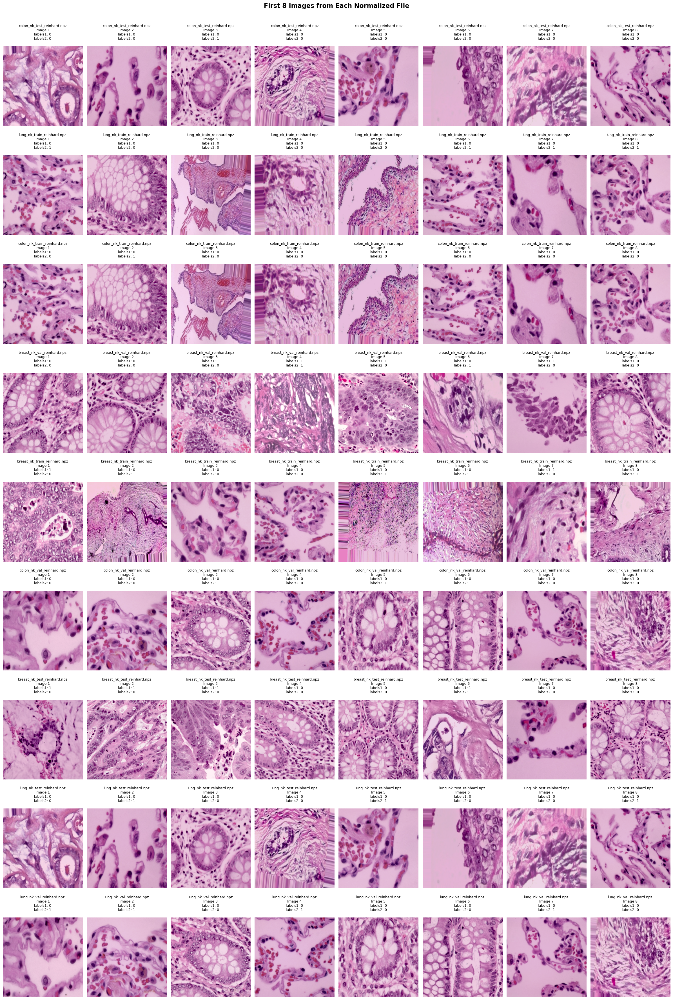


DETAILED INFORMATION

colon_nk_test_reinhard.npz:
  Image 1:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 0.00, Max: 255.00
    - labels1: 0
    - labels2: 0
  Image 2:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 0.00, Max: 225.00
    - labels1: 0
    - labels2: 0
  Image 3:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 0.00, Max: 234.00
    - labels1: 0
    - labels2: 1
  Image 4:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 0.00, Max: 242.00
    - labels1: 0
    - labels2: 0
  Image 5:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 0.00, Max: 231.00
    - labels1: 0
    - labels2: 0
  Image 6:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 0.00, Max: 240.00
    - labels1: 0
    - labels2: 0
  Image 7:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 37.00, Max: 251.00
    - labels1: 0
    - labels2: 0
  Image 8:
    - Shape: (224, 224, 3)
    - Dtype: uint8
    - Min: 0.00, Max: 227.00
    - labels1: 0
    -

In [5]:
import matplotlib.pyplot as plt

# Load and plot first 8 images from each normalized file in the same figure
print("="*70)
print("LOADING AND PLOTTING NORMALIZED IMAGES")
print("="*70)

# Find all reinhard normalized files
reinhard_files = list(Path(output_folder).glob('*_reinhard.npz'))

if len(reinhard_files) == 0:
    print(f"\n✗ No normalized files found in '{output_folder}'!")
else:
    print(f"\nFound {len(reinhard_files)} normalized files:")
    for file in reinhard_files:
        print(f"  - {file.name}")
    
    # Collect all data first
    all_file_data = []
    for npz_file in reinhard_files:
        try:
            data = np.load(str(npz_file), allow_pickle=True)
            images = data['images']
            label_keys = [key for key in data.files if key != 'images']
            labels_dict = {key: data[key] for key in label_keys}
            
            num_images = min(8, len(images))
            first_images = images[:num_images]
            
            all_file_data.append({
                'filename': npz_file.name,
                'images': first_images,
                'label_keys': label_keys,
                'labels_dict': labels_dict,
                'num_images': num_images
            })
            
            print(f"  ✓ Loaded {npz_file.name}")
        except Exception as e:
            print(f"  ✗ Error loading {npz_file.name}: {str(e)}")
    
    # Create combined figure with all normalized files
    if all_file_data:
        num_files = len(all_file_data)
        fig, axes = plt.subplots(num_files, 8, figsize=(24, 4*num_files))
        
        # Handle case of single file (axes won't be 2D)
        if num_files == 1:
            axes = axes.reshape(1, -1)
        
        # Plot images
        for file_idx, file_data in enumerate(all_file_data):
            for img_idx in range(file_data['num_images']):
                ax = axes[file_idx, img_idx]
                img = file_data['images'][img_idx]
                ax.imshow(img)
                
                # Create label text
                label_text = f"{file_data['filename']}\nImage {img_idx+1}\n"
                for label_key in file_data['label_keys']:
                    label_value = file_data['labels_dict'][label_key][img_idx]
                    label_text += f"{label_key}: {label_value}\n"
                
                ax.set_title(label_text, fontsize=9)
                ax.axis('off')
            
            # Hide empty subplots if fewer than 8 images
            for img_idx in range(file_data['num_images'], 8):
                axes[file_idx, img_idx].axis('off')
        
        fig.suptitle('First 8 Images from Each Normalized File', 
                    fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout(rect=[0, 0, 1, 0.99])
        plt.show()
        
        # Print detailed summary
        print(f"\n{'='*70}")
        print("DETAILED INFORMATION")
        print(f"{'='*70}")
        
        for file_data in all_file_data:
            print(f"\n{file_data['filename']}:")
            for i in range(file_data['num_images']):
                print(f"  Image {i+1}:")
                print(f"    - Shape: {file_data['images'][i].shape}")
                print(f"    - Dtype: {file_data['images'][i].dtype}")
                print(f"    - Min: {file_data['images'][i].min():.2f}, Max: {file_data['images'][i].max():.2f}")
                for label_key in file_data['label_keys']:
                    print(f"    - {label_key}: {file_data['labels_dict'][label_key][i]}")

print(f"\n{'='*70}")
print("✓ Combined plotting complete!")
print(f"{'='*70}")
